# Project 4: Chapter 4: Functional Programming
Statistical Functions

In [1]:
import random

In [2]:
def total(lst):
    total_ = 0
# n = len(lst)
# for i in range (n):
# total_ = lst[i]
    
    for val in lst:
        total_ += val
    return total_

X1 = [i for i in range(3, 31,3)]
X2 = [random.randint(0,100) for i in range(100)]
print("X1", X1)
print("X2", X2)

X1 [3, 6, 9, 12, 15, 18, 21, 24, 27, 30]
X2 [52, 57, 41, 79, 39, 52, 98, 92, 0, 45, 34, 21, 15, 21, 53, 41, 17, 21, 74, 26, 79, 75, 79, 50, 70, 93, 2, 13, 27, 99, 24, 44, 88, 53, 76, 28, 50, 20, 72, 39, 80, 31, 91, 11, 79, 39, 37, 53, 36, 90, 48, 88, 39, 97, 100, 33, 94, 96, 5, 45, 42, 57, 0, 73, 99, 37, 38, 58, 66, 80, 76, 56, 75, 2, 93, 91, 97, 1, 27, 99, 76, 67, 94, 43, 11, 82, 87, 94, 15, 79, 33, 45, 42, 32, 29, 86, 42, 6, 36, 66]


In [3]:
total1 = total(X1)
total2 = total(X2)
print("Total of X1:", total1)
print("Total of X2:", total2)

Total of X1: 165
Total of X2: 5383


In [4]:
sum(X1), sum(X2)

(165, 5383)

### Mean

In [5]:
def mean(lst):
    n= len(lst)
    mean_ = total(lst) / n
    return mean_

In [6]:
print("Mean of X1", mean(X1))
print("Mean of X2", mean(X2))

Mean of X1 16.5
Mean of X2 53.83


In [7]:
import numpy as np
np.mean(X1), np.mean(X2)

(16.5, 53.83)

### Median

The median is either 1) the value that appears exactly in the middle of the ordered list if the length of the list is odd or 2) the average of the two middle values that appear in the middle of the list if the length is even

In [8]:
def median(lst):
    n = len(lst)
    lst = sorted(lst)
# the percent opperator calculates the remainder
    if n % 2 != 0:
        # Case 1: list length is odd
        # coerce float to int
        middle_index = int((n-1) / 2)
        median_ = lst[middle_index]
        # Case 2: list is even in length
        ## take the average of the middle two values
    else:
        upper_middle_index = int(n /2)
        lower_middle_index = upper_middle_index - 1
        median_ = mean(lst[lower_middle_index : upper_middle_index +1])
    return median_
median1 = median(X1)
median2 = median(X2)
print("Median of X1", median1)
print("Median of X2", median2)

Median of X1 16.5
Median of X2 51.0


In [9]:
median((X1) + [100])

18

In [10]:
median(X1 +[20,100])

19.0

### Mode

In [11]:
def mode(lst):
    # use to record value(s) 
    max_count = 0
    counter_dict = {}
    for value in lst:
        counter_dict[value] = 0
    for value in lst:
        counter_dict[value] += 1
    max_count = max(counter_dict.values())
    # mode_ = [key for key in counter_dict.keys() if counter_dict[key] == max_count]
    mode_ = [key for key, count in counter_dict.items() if count == max_count]
    
    return mode_
print("Mode of X1", mode(X1))
print("Mode of X2", mode(X2))

Mode of X1 [3, 6, 9, 12, 15, 18, 21, 24, 27, 30]
Mode of X2 [79]


### Variance

In [12]:
def variance(lst, sample = True):
    # popvar(list) - sum(xi - list_mean)**2 / n for all xi in list
    # save mean value of list
    list_mean = mean(lst)
    # use n to calculate average of sum squared diffs
    n = len(lst)
    DoF = n - 1
    
    sum_sq_diff = 0
    for val in lst:
        sum_sq_diff += (val - list_mean) ** 2
    # Case 1: list of values represent entire population
    if sample == False:
        # normalize result by dividing by n
        variance_ = sum_sq_diff / n
    # Case 2: list of values represent a sample
    else:
        # divide by DoF for sample
        variance_ = sum_sq_diff / DoF
    return variance_
print("Variance of X1:", variance(X1))
print("Variance pf X2:", variance(X2))
    

Variance of X1: 82.5
Variance pf X2: 870.3243434343433


Text(0, 53.83, 'Mean(X2)')

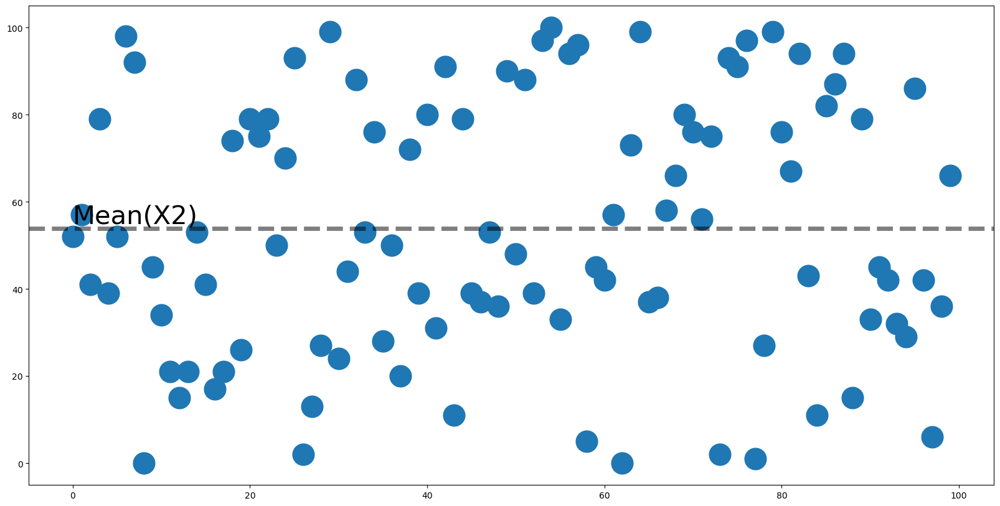

In [13]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (20,10))
ax.plot(X2, ls = "", marker = ".", markersize = 50)
ax.axhline(mean(X2), linewidth = 5, alpha = .5, ls = "--", color = "k")
ax.text(0, mean(X2), "Mean(X2)", va = "bottom", fontsize = 30)

### Standard Deviation

In [14]:
# standard deviation 
def SD(lst, sample = True):
    #standard deviation is the square root of variance
    SD_ = variance(lst, sample) ** (1/2)
    return SD_
print("SD of X1:", SD(X1))
print("SD of X2:", SD(X2))

SD of X1: 9.082951062292475
SD of X2: 29.501260031299395


### Standard Error

In [15]:
def STE(lst, sample = True):
    n = len(lst)
    se = SD(lst, sample) / n**(1/2)
    return se
print("STE of X1", STE(X1))
print("STE of X2", STE(X2))

STE of X1 2.872281323269014
STE of X2 2.9501260031299394


### Covariance
$cov_{pop}(x,y) = \frac{\sum_{i=0}^{n-1}{(x_i-x_{mean})(y_i - y_{mean}}}{n}$

In [16]:
# if both lists were identical then wed be calculating the variance

def covariance(x, y, sample = False):
    meanx = mean(x)
    meany = mean(y)
    
    cov = 0
    nx = len(x)
    ny = len(y)
    if nx == ny:
        n = nx
        for i in range(n):
            cov += (x[i] - meanx) * (y[i] - meany)
        if sample == False:
            cov = cov / n
        else:
            cov = cov / (n-1)
        return cov
    else:
        print("List lengths are not equal.", nx, "!=", ny)


In [17]:
covx1x2 = covariance(X1, X2[:10])
covx1x2

-20.55

In [18]:
covx1x2 = covariance(X1, X2[1:])
covx1x2

List lengths are not equal. 10 != 99


### Correlation
negative correlation is -1, positive correlation is 1, and no correlation is 0

$corr(x,y) = \frac{cov(x,y)}{\sigma_x * \sigma_y}}

correlation normalizes $cov(x,y)$ by dividing out the standard deviation $\sigma_x$ and $\sigma_y$.

In [19]:
def correlation(x,y):
    cov = covariance(x,y)
    SDx = SD(x)
    SDy = SD(y)
    corr = cov / (SDx * SDy)
    return corr
corr_X1_X2 = correlation(X1,X2[:10])
corr_X1_X2

-0.07895310168229325

In [20]:
import numpy as np
import pandas as pd
import matplotlib as plt
from scipy import stats

In [21]:
simpsons = {j:[np.random.normal() * 20 +int(i/10)\
              for i in range(1000)] for j in range (10)}
pd.DataFrame(simpsons).tail()

,0,1,2,3,4,5,6,7,8,9
995,122.936146,72.438793,62.451923,111.806757,114.437563,107.921564,82.734743,83.910153,81.926186,100.561173
996,85.310882,99.250750,98.712417,93.878870,137.775137,62.475687,122.361320,93.132484,83.566617,68.202155
997,100.744385,78.832778,84.346542,124.604522,47.052651,78.574926,105.459813,93.659355,62.510542,105.591780
998,104.048614,96.548349,110.868774,88.057134,94.617627,117.684488,115.909721,128.138765,99.262962,74.776217
999,137.628782,94.403518,77.182495,114.798976,104.782668,103.355167,75.375641,88.777696,104.394681,87.500535


In [22]:
values = []
for j in simpsons.keys():
    ix_interval = j * 100
    simpsons[j] = pd.DataFrame(simpsons[j], index = np.arange(ix_interval, len(simpsons[j]) + ix_interval)).sub(j * 35)
    simpsons[j]["Index"] = simpsons[j].index
    simpsons[j]["Entity"] = int(j)
    values = values + list(simpsons[j].values)
stacked_simpsons = pd.DataFrame(values, columns = ["y", "x", "Entity"])
stacked_simpsons.head()

,y,x,Entity
0,4.538839,0.0,0.0
1,4.510503,1.0,0.0
2,-14.965813,2.0,0.0
3,-12.383045,3.0,0.0
4,-21.014467,4.0,0.0


In [23]:
stacked_simpsons.corr()["x"]["y"]
#correlation(stacked_simpsons["x"], stacked_simpsons["y"])
stacked_simpsons.groupby("Entity").corr().round(2)

y     x
Entity              
0.0    y  1.00  0.82
       x  0.82  1.00
1.0    y  1.00  0.82
       x  0.82  1.00
2.0    y  1.00  0.82
       x  0.82  1.00
3.0    y  1.00  0.84
       x  0.84  1.00
4.0    y  1.00  0.82
       x  0.82  1.00
5.0    y  1.00  0.82
       x  0.82  1.00
6.0    y  1.00  0.82
       x  0.82  1.00
7.0    y  1.00  0.84
       x  0.84  1.00
8.0    y  1.00  0.80
       x  0.80  1.00
9.0    y  1.00  0.82
       x  0.82  1.00

Text(0.5, 1.0, 'Data appears to be negatively correlated\n-0.475849880280502')

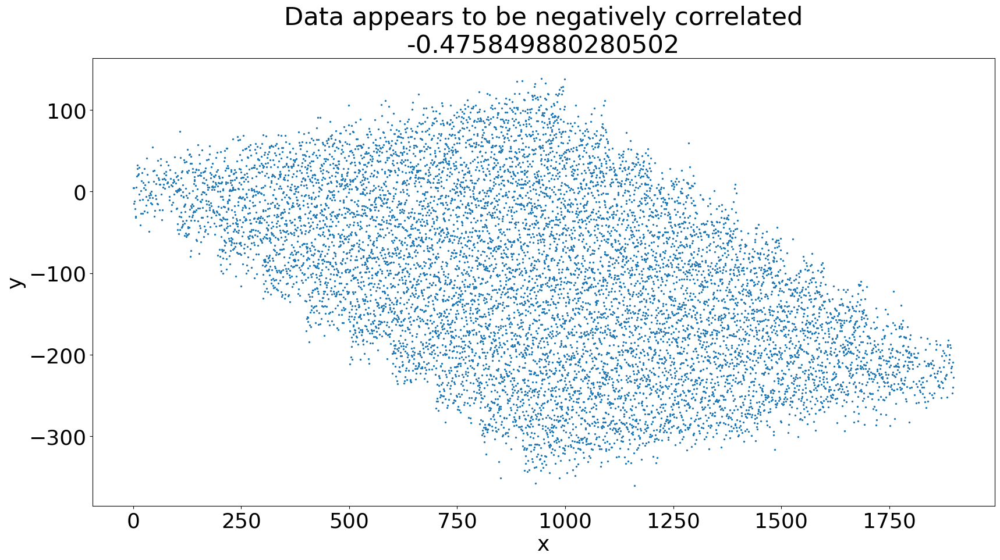

In [24]:
import matplotlib.pyplot as plt
plt.rcParams.update({"font.size" :26})
fig, ax = plt.subplots(figsize = (20,10))
stacked_simpsons.plot.scatter(x = "x",
                             y = "y",
                             s = 2, 
                             c = "C0",
                             ax = ax)
pooled_correlations = str(correlation(stacked_simpsons["x"], stacked_simpsons["y"]))
ax.set_title("Data appears to be negatively correlated\n" + pooled_correlations)

In [25]:
corr_by_entity = stacked_simpsons.groupby("Entity").corr().round(2)
corr_by_entity[
    corr_by_entity.index.get_level_values(1) == "x"]["y"]

Entity   
0.0     x    0.82
1.0     x    0.82
2.0     x    0.82
3.0     x    0.84
4.0     x    0.82
5.0     x    0.82
6.0     x    0.82
7.0     x    0.84
8.0     x    0.80
9.0     x    0.82
Name: y, dtype: float64

Text(0.5, 1.0, 'With Group Controls Correlations is Positive')

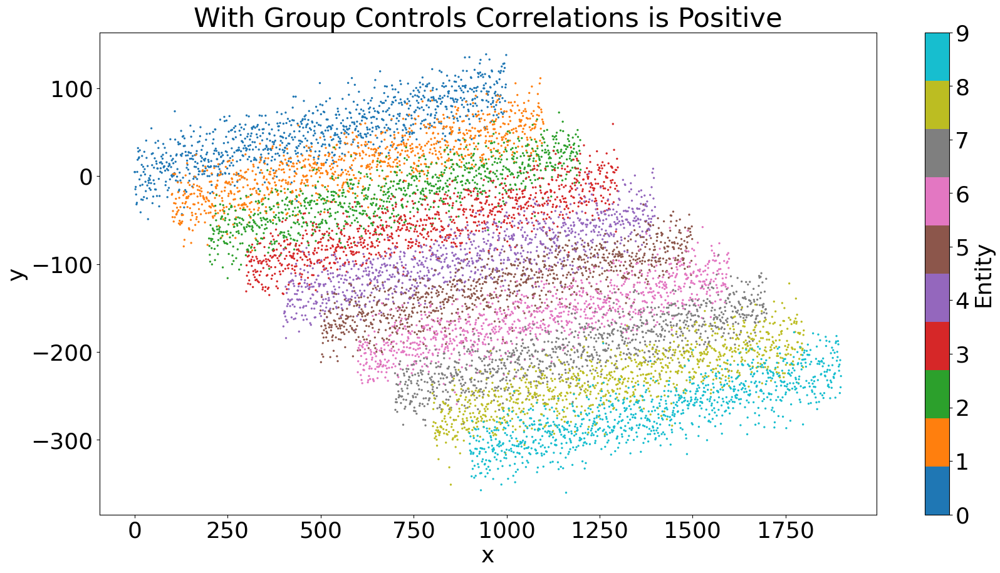

In [26]:
import matplotlib.cm as cm
fig, ax = plt.subplots(figsize=(20,10))
stacked_simpsons.plot.scatter(x ="x",
                             y = "y",
                             s = 2,
                             #alpha = 0.1
                             c = "Entity",
                             cmap = "tab10",
                             ax = ax)
ax.set_title("With Group Controls Correlations is Positive")

## Simpsons Paradox and Drug Trials

In [27]:
csv_url = "https://raw.githubusercontent.com/PacktPublishing/Causal-Inference-and-Discovery-in-Python/main/data/ch_01_drug_data.csv"
data = pd.read_csv(csv_url).set_index("Drug").T.reset_index()
for ab in ("A", "B"):
    data["index"][data["index"] == ab + ".1"] = ab
data.rename(columns = {"index":"Drug"}, inplace = True)
data

C:\Users\aleah\AppData\Local\Temp\ipykernel_6124\2622359954.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["index"][data["index"] == ab + ".1"] = ab


Drug,Drug,Clot,Female,Male,Total
0,A,1,24,3,27
1,A,0,56,39,95
2,B,1,17,6,23
3,B,0,25,74,99


In [28]:
# unstack makes columns out of a secondary index
plot_df = data.groupby(["Drug", "Clot"])["Total"].sum().unstack()
plot_df

Clot,0,1
Drug,,
A,95,27
B,99,23


<Axes: xlabel='Drug'>

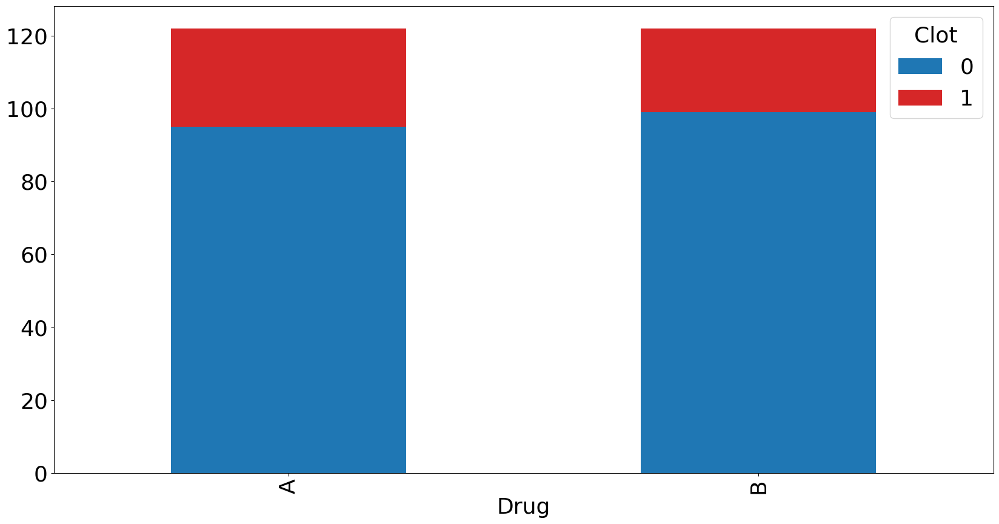

In [29]:
colors = ["C0", "C3"]
fig, ax = plt.subplots(figsize = (20,10))
plot_df.plot.bar(stacked = True, 
                 legend = True, 
                 color = colors,
                ax = ax)


## Stacked Barplot(Plotly)

In [30]:
import plotly.graph_objects as go
fig = go.Figure()
# Adding each stack (clot type in this case) as a separate trace
for clot_type in plot_df.columns:
    fig.add_trace(go.Bar(
        x=plot_df.index,
        y=plot_df[clot_type],
        name="Clot: " + str(clot_type)
    ))

# Update layout for a stacked bar plot
fig.update_layout(
    barmode='stack',
    title='Clotting by Drug',
    xaxis_title='Drug',
    yaxis_title='Total'#,
#     legend_title='Clot Type'
)

# Show the plot
fig.show()

### Gender was not evenly distributed between trials

In [31]:
plot_df = data.groupby(["Drug", "Clot"])[["Male", "Female"]].sum().unstack().T
plot_df

Drug          A   B
Drug   Clot        
Male   0     39  74
       1      3   6
Female 0     56  25
       1     24  17

In [32]:
plot_df = data.groupby(["Drug", "Clot"])[["Male", "Female"]].sum().unstack().T
plot_df.index.names = ("Gender", "Clot")
# Transpose so we can stack data by row in the bar graph
plot_df = plot_df.groupby("Gender").sum().T
plot_df

Gender,Female,Male
Drug,,
A,80,42
B,42,80


<Axes: xlabel='Drug'>

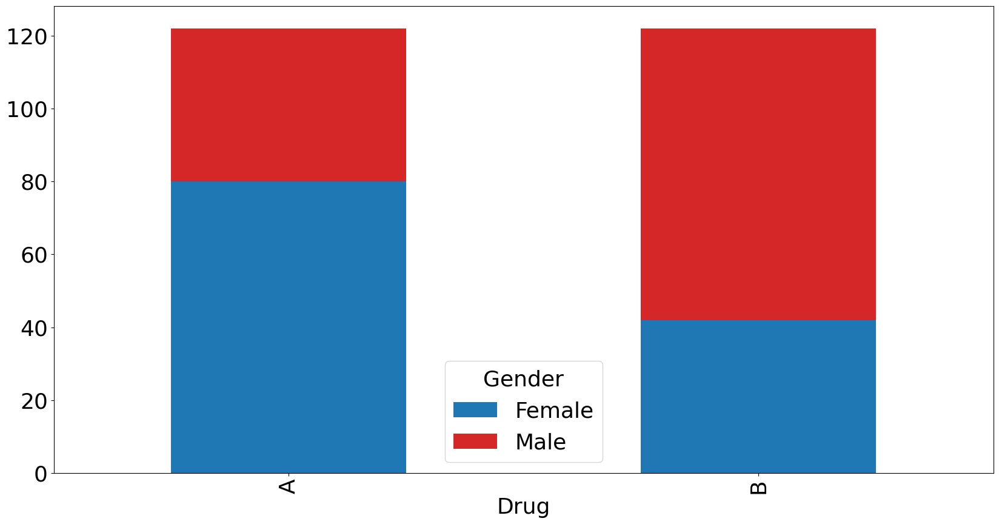

In [33]:
fig, ax = plt.subplots(figsize = (20,10))
plot_df.plot.bar(ax = ax,
                stacked = True,
                color = colors,
                legend = True)

In [34]:
# COPY AND PASTED FROM NOTES
plot_df = data.groupby(["Drug","Clot"])[["Male", "Female"]].sum().unstack().T
plot_df.index.names = ("Gender", "Clot")
plot_df = plot_df.groupby("Gender").sum().T

# Create an interactive stacked bar plot using Plotly
fig = go.Figure()

# Adding each stack (gender in this case) as a separate trace
for gender in plot_df.columns:
    fig.add_trace(go.Bar(
        x=plot_df.index,
        y=plot_df[gender],
        name=str(gender)
    ))

# Update layout for a stacked bar plot
fig.update_layout(
    barmode='stack',
    title='Gender Composition by Drug Trial',
    xaxis_title='Drug',
    yaxis_title='Total Count',
    legend_title='Gender'
)

# Show the plot
fig.show()

### Present Results for Each Trial Controlling for Gender

In [35]:
plot_df = data.groupby(["Clot", "Drug"])[["Male", "Female", "Total"]].sum().unstack().T
plot_df

Clot          0   1
Drug   Drug        
Male   A     39   3
       B     74   6
Female A     56  24
       B     25  17
Total  A     95  27
       B     99  23

In [36]:
pct_df = plot_df.copy()

for key in pct_df.keys():
    pct_df[key] = pct_df[key].div(plot_df.sum(axis = 1))
pct_df.round(2)

Clot            0     1
Drug   Drug            
Male   A     0.93  0.07
       B     0.92  0.08
Female A     0.70  0.30
       B     0.60  0.40
Total  A     0.78  0.22
       B     0.81  0.19

<Axes: xlabel='Drug,Drug'>

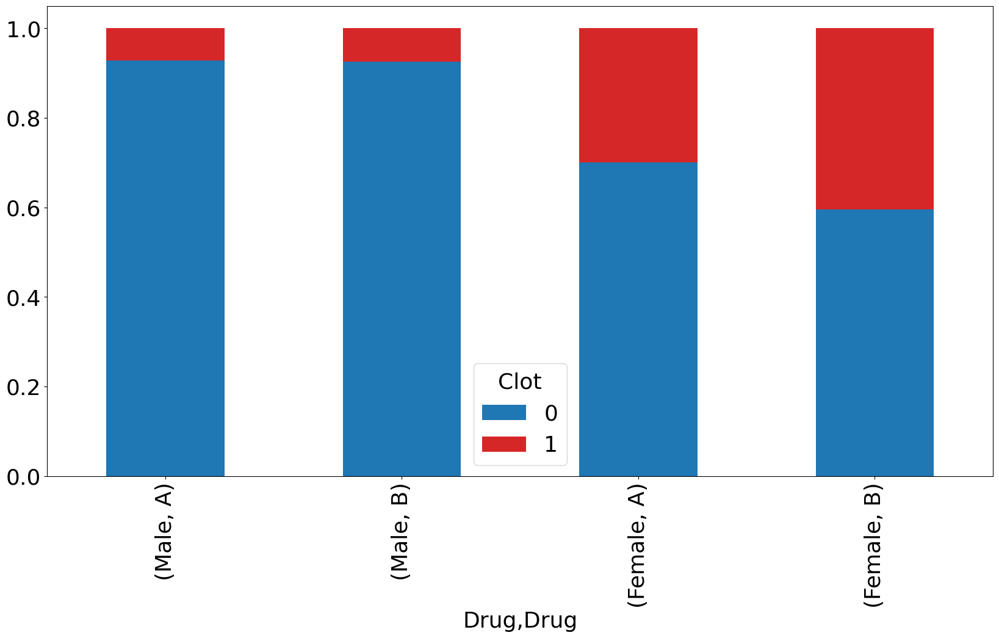

In [37]:
fig, ax = plt.subplots(figsize = (20, 10))
# plot by male and female
pct_df.loc[["Male", "Female"]].plot.bar(ax = ax,
                                        # every bar seperates values within row by column
                                       stacked = ["Clot"],
                                       color = colors,
                                       legend = True)

In [38]:
# COPY AND PASTED FROM NOTES
pct_df_gender = pct_df.loc[["Male", "Female"]].round(3)
color_map = {
    0:'blue', #Color for CLot 0
    1: 'red', #Color for Clot 1
}
# Transparency (alpha) values for gender
opacity_map = {
    'Male': 1,    # Opaque for males
    'Female': 0.6  # More transparent for females
}

# Initialize an empty figure
fig = go.Figure()

# Iterate through the DataFrame and add a bar for each gender and drug combination
for (gender, drug), values in pct_df_gender.iterrows():
    for clot in range(len(values)):
        fig.add_trace(go.Bar(
            name=f"Clot {clot}",  # We will use this in the legend
            x=[f"{gender} {drug}"],
            y=[values[clot]],
            marker=dict(color=color_map[clot], opacity=opacity_map[gender]),
            legendgroup=f"Clot {clot}",
            showlegend=False  # We do not show these traces in the legend
        ))
# Add two traces for the legend
for clot in [0, 1]:
    fig.add_trace(go.Bar(
        name=f"Clot {clot}",
        x=[None],
        y=[None],
        marker=dict(color=color_map[clot], opacity=1),
        legendgroup=f"Clot: {clot}",
        showlegend=True
    ))

# Update layout for stacked bar plot
fig.update_layout(
    barmode='stack',
    title='Clots by Gender and Drug',
    xaxis=dict(title='Drug', type='category'),
    yaxis=dict(title='Percentage'),
    legend_title='Clot',
    legend=dict(
        traceorder='normal',
        orientation='h',
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Show the plot
fig.show()

In [39]:
#statsFunctions.py
# . . . 
def skewness(lst, sample = False):
    mean_ = mean(lst)
    SD_ = SD(lst, sample)
    skew = 0
    n = len(lst)
    for val in lst:
        skew += (val - mean_) ** 3
    skew = skew / (n * SD_ ** 3) if not sample else  skew / ((n - 1)*(n - 2) * SD_ ** 3)
        
    return skew

# . . . 
skew1 = skewness(X1, sample = False)
skew2 = skewness(X2, sample = False)
print("skewness of list1:", skew1)
print("skewness of list2:", skew2)
sample_skew1 = skewness(X1, sample = True)
sample_skew2 = skewness(X2, sample = True)
print("sample skewness of list1:", sample_skew1)

skewness of list1: 0.0
skewness of list2: -0.05219851042676754
sample skewness of list1: 0.0


In [40]:
#statsFunctions.py
# . . .
def kurtosis(lst, sample = False):
    mean_ = mean(lst)
    kurt = 0
    SD_ = SD(lst, sample)
    n = len(lst)
    for x in lst:
        kurt += (x - mean_) ** 4
    kurt = kurt / (n * SD_ ** 4) if  sample == False else  n * (n + 1) * kurt / \
    ((n - 1) * (n - 2) * (n - 3) * (SD_ ** 4)) - (3 *(n - 1) ** 2) / ((n - 2) * (n - 3))
    
    return kurt

# . . .
kurt1 = kurtosis(X1)
kurt2 = kurtosis(X2)
print("kurtosis of list1:", kurt1)
print("kurtosis of list2:", kurt2)
sample_kurt1 = kurtosis(X1, sample = True)  
sample_kurt2 = kurtosis(X2, sample = True)  
print("sample kurtosis of list1:", sample_kurt1)  
print("sample kurtosis of list2:", sample_kurt2)

kurtosis of list1: 1.7757575757575759
kurtosis of list2: 1.8462533497427494
sample kurtosis of list1: -1.1999999999999997
sample kurtosis of list2: -1.1510953877469225


## Using a Nested Dictionary to Organize Statistics

In [41]:
stats_dict = {}   
stats_dict["X1"] = {}  
stats_dict["X1"]["list"] = X1    
stats_dict["X2"] = {}  
stats_dict["X2"]["list"] = X2  
stats_dict

{'X1': {'list': [3, 6, 9, 12, 15, 18, 21, 24, 27, 30]},
 'X2': {'list': [52,
   57,
   41,
   79,
   39,
   52,
   98,
   92,
   0,
   45,
   34,
   21,
   15,
   21,
   53,
   41,
   17,
   21,
   74,
   26,
   79,
   75,
   79,
   50,
   70,
   93,
   2,
   13,
   27,
   99,
   24,
   44,
   88,
   53,
   76,
   28,
   50,
   20,
   72,
   39,
   80,
   31,
   91,
   11,
   79,
   39,
   37,
   53,
   36,
   90,
   48,
   88,
   39,
   97,
   100,
   33,
   94,
   96,
   5,
   45,
   42,
   57,
   0,
   73,
   99,
   37,
   38,
   58,
   66,
   80,
   76,
   56,
   75,
   2,
   93,
   91,
   97,
   1,
   27,
   99,
   76,
   67,
   94,
   43,
   11,
   82,
   87,
   94,
   15,
   79,
   33,
   45,
   42,
   32,
   29,
   86,
   42,
   6,
   36,
   66]}}

In [42]:
for key in stats_dict.keys():
    lst = stats_dict[key]["list"]
    stats_dict[key]["total"] = total(lst)
    stats_dict[key]["mean"] = mean(lst)
    stats_dict[key]["median"] = median(lst)
    stats_dict[key]["mode"] = mode(lst)
    stats_dict[key]["variance"] = variance(lst)
    stats_dict[key]["standard deviation"] = SD(lst)
    stats_dict[key]["standard error"] = STE(lst)
    stats_dict[key]["skewness"] = skewness(lst)
    stats_dict[key]["kurtosis"] = kurtosis(lst)
stats_dict

{'X1': {'list': [3, 6, 9, 12, 15, 18, 21, 24, 27, 30],
  'total': 165,
  'mean': 16.5,
  'median': 16.5,
  'mode': [3, 6, 9, 12, 15, 18, 21, 24, 27, 30],
  'variance': 82.5,
  'standard deviation': 9.082951062292475,
  'standard error': 2.872281323269014,
  'skewness': 0.0,
  'kurtosis': 1.7757575757575759},
 'X2': {'list': [52,
   57,
   41,
   79,
   39,
   52,
   98,
   92,
   0,
   45,
   34,
   21,
   15,
   21,
   53,
   41,
   17,
   21,
   74,
   26,
   79,
   75,
   79,
   50,
   70,
   93,
   2,
   13,
   27,
   99,
   24,
   44,
   88,
   53,
   76,
   28,
   50,
   20,
   72,
   39,
   80,
   31,
   91,
   11,
   79,
   39,
   37,
   53,
   36,
   90,
   48,
   88,
   39,
   97,
   100,
   33,
   94,
   96,
   5,
   45,
   42,
   57,
   0,
   73,
   99,
   37,
   38,
   58,
   66,
   80,
   76,
   56,
   75,
   2,
   93,
   91,
   97,
   1,
   27,
   99,
   76,
   67,
   94,
   43,
   11,
   82,
   87,
   94,
   15,
   79,
   33,
   45,
   42,
   32,
   29,
   86,
   42,
  

In [43]:
stats_df = pd.DataFrame(stats_dict)
stats_df

,X1,X2
list,"[3, 6, 9, 12, 15, 18, 21, 24, 27, 30]","[52, 57, 41, 79, 39, 52, 98, 92, 0, 45, 34, 21..."
total,165,5383
mean,16.5,53.83
median,16.5,51.0
mode,"[3, 6, 9, 12, 15, 18, 21, 24, 27, 30]",[79]
variance,82.5,870.324343
standard deviation,9.082951,29.50126
standard error,2.872281,2.950126
skewness,0.0,-0.052199
kurtosis,1.775758,1.846253


In [44]:
stats_names = ["total",
             "mean",
             "median",
             "standard deviation",
             "standard error",
             "skewness",
             "kurtosis"]
stats_df.loc[stats_names]

,X1,X2
total,165,5383
mean,16.5,53.83
median,16.5,51.0
standard deviation,9.082951,29.50126
standard error,2.872281,2.950126
skewness,0.0,-0.052199
kurtosis,1.775758,1.846253


In [45]:
pd.DataFrame(X1).describe()

,0
count,10.000000
mean,16.500000
std,9.082951
min,3.000000
25%,9.750000
50%,16.500000
75%,23.250000
max,30.000000


In [46]:
import pandas as pd
def gather_statistics(df, sample = True, round_to = 3):
    # create an entry in the dictionary for each column of data
    dct = {key:{} for key in df}
    
    for key, vals in df.items():
        # .dropna(axis = 0 drops any row with a null value)
        ## axis = 1 would drop any column with a null value
        vals = vals.dropna(axis=0)
        dct[key]["mean"] = round(mean(vals), round_to)
        dct[key]["median"] = round(median(vals), round_to)
        dct[key]["variance"] = round(variance(vals, sample), round_to)
        dct[key]["SD"] = round(SD(vals, sample), round_to)
        dct[key]["STE"] = round(STE(vals, sample), round_to)
        dct[key]["skewness"] = round(skewness(vals, sample), round_to)
        dct[key]["kurtosis"] = round(kurtosis(vals, sample), round_to)
    stats_df = pd.DataFrame(dct)
    return stats_df

data = pd.DataFrame([X1, X2], 
                    index = ["List1", "List2"]).T
gather_statistics(data, sample = False, round_to = 1)

,List1,List2
mean,16.5,53.8
median,16.5,51.0
variance,74.2,861.6
SD,8.6,29.4
STE,2.7,2.9
skewness,0.0,-0.1
kurtosis,1.8,1.8


In [47]:
data.loc[0, "List1"] = np.nan
data.dropna(axis = 1)

,List2
0,52.0
1,57.0
2,41.0
3,79.0
4,39.0
...,...
95,86.0
96,42.0
97,6.0
98,36.0


In [48]:
from scipy import stats
dir(stats)

['ConstantInputWarning',
 'Covariance',
 'DegenerateDataWarning',
 'FitError',
 'NearConstantInputWarning',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_axis_nan_policy',
 '_biasedurn',
 '_binned_statistic',
 '_binomtest',
 '_boost',
 '_common',
 '_constants',
 '_continuous_distns',
 '_covariance',
 '_crosstab',
 '_discrete_distns',
 '_distn_infrastructure',
 '_distr_params',
 '_entropy',
 '_fit',
 '_hypotests',
 '_kde',
 '_ksstats',
 '_levy_stable',
 '_mannwhitneyu',
 '_morestats',
 '_mstats_basic',
 '_mstats_extras',
 '_multivariate',
 '_mvn',
 '_odds_ratio',
 '_page_trend_test',
 '_qmc',
 '_qmc_cy',
 '_rcont',
 '_relative_risk',
 '_resampling',
 '_rvs_sampling',
 '_sobol',
 '_statlib',
 '_stats',
 '_stats_mstats_common',
 '_stats_py',
 '_stats_pythran',
 '_tukeylambda_stats',
 '_variation',
 '_warnings_errors',
 'alexandergovern',
 'alpha',
 'anderson',
 'anderson_ksamp',
 'anglit',
 'an

In [50]:
stats.mean(X1)

AttributeError: module 'scipy.stats' has no attribute 'mean'

In [51]:
filename = "economic-freedom-of-the-world-2022-master-index-data-for-researchers-iso-v5.xlsx"
data = pd.read_excel(filename, 
                      index_col = [2,1],
                      header = [4])
data.shape

(4455, 109)

In [52]:
#drop empty columns with axis = 1
data.dropna(how = "all", axis = 1)
data.shape

(4455, 109)

In [53]:
data.head()

,,Unnamed: 0,ISO Code 3,Countries,Economic Freedom Summary Index,Rank,Quartile,1A Government Consumption,data,1B Transfers and subsidies,data.1,...,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,Unnamed: 107,Unnamed: 108,Unnamed: 109,Unnamed: 110
ISO Code 2,Year,,,,,,,,,,,,,,,,,,,,,
AL,2020,NaN,ALB,Albania,7.64,26.0,1.0,8.026471,12.71,6.978202,11.590000,...,2011.00,2012.00,2013.00,2014.00,2015.00,2016.0,2017.0,2018.0,2019.00,2020.00
DZ,2020,NaN,DZA,Algeria,5.12,157.0,4.0,3.102941,29.45,7.817129,8.511137,...,153.00,153.00,157.00,159.00,159.00,162.0,162.0,162.0,165.00,165.00
AO,2020,NaN,AGO,Angola,5.91,138.0,4.0,7.700000,13.82,9.702997,1.590000,...,38.25,38.25,39.25,39.75,39.75,40.5,40.5,40.5,41.25,41.25
AR,2020,NaN,ARG,Argentina,4.87,161.0,4.0,5.985294,19.65,6.493188,13.370000,...,114.75,114.75,117.75,119.25,119.25,121.5,121.5,121.5,123.75,123.75
AM,2020,NaN,ARM,Armenia,7.84,11.0,1.0,6.605882,17.54,7.223433,10.690000,...,76.50,76.50,78.50,79.50,79.50,81.0,81.0,81.0,82.50,82.50


In [54]:
data = pd.read_excel(filename,
                    sheet_name = None)
data.keys()

dict_keys(['EFW Data 2022 Report', 'EFW Panel Data 2022 Report', 'EFW Data 1950_1965'])

In [55]:
data = pd.read_excel(filename,
                     index_col = [2,0],
                     header =[0],
                     sheet_name = "EFW Panel Data 2022 Report")
data.shape

(4455, 11)

In [56]:
rename = {"Panel Data Summary Index":"Summary",
         "Area 1": "Size of Government",
         "Area 2": "Legal System and Property Rights",
         "Area 3": "Sound Money",
         "Area 4": "Freedom to Trade Internationally",
         "Area 5": "Regulation"}
data = data.rename(columns = rename)
# no columns or rows are actually dropped
data = data.dropna(how = "all", axis = 1)
data.shape

(4455, 11)

In [57]:
data = data[data.keys()[4:-1]]
data.head()

,,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
ISO_Code_3,Year,,,,,,
ALB,2020,7.64,7.817077,5.260351,9.788269,8.222499,7.112958
DZA,2020,5.12,4.409943,4.131760,7.630287,3.639507,5.778953
AGO,2020,5.91,8.133385,3.705161,6.087996,5.373190,6.227545
ARG,2020,4.87,6.483768,4.796454,4.516018,3.086907,5.490538
ARM,2020,7.84,7.975292,6.236215,9.553009,7.692708,7.756333


In [58]:
data.keys()

Index(['Summary', 'Size of Government', 'Legal System and Property Rights',
       'Sound Money', 'Freedom to Trade Internationally', 'Regulation'],
      dtype='object')

In [59]:
data_for_stats = data.dropna(how = "all", axis = 0)
stats_df = gather_statistics(data_for_stats, sample = False)
stats_df

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
mean,6.586,6.579,5.229,7.766,6.746,6.691
median,6.726,6.634,5.055,8.101,7.001,6.842
variance,1.337,1.553,2.846,3.154,2.928,1.545
SD,1.156,1.246,1.687,1.776,1.711,1.243
STE,0.019,0.020,0.028,0.029,0.028,0.020
skewness,-0.575,-0.245,0.360,-1.257,-0.973,-0.634
kurtosis,3.054,2.941,2.425,5.196,4.156,3.425


In [60]:
stats_df.to_csv("EFWStats.csv")

In [61]:
data_for_stats.corr().round(2).to_csv("EFWCorr.csv")
data_for_stats.corr().round(2)

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Summary,1.00,0.33,0.76,0.83,0.86,0.83
Size of Government,0.33,1.00,-0.10,0.16,0.15,0.20
Legal System and Property Rights,0.76,-0.10,1.00,0.52,0.63,0.64
Sound Money,0.83,0.16,0.52,1.00,0.68,0.60
Freedom to Trade Internationally,0.86,0.15,0.63,0.68,1.00,0.64
Regulation,0.83,0.20,0.64,0.60,0.64,1.00


In [62]:
data_for_stats.to_csv("CleanedEconFreedomData.csv")

In [63]:
data = data_for_stats.copy()

In [64]:
data[["Summary",
      "Legal System and Property Rights",
      "Freedom to Trade Internationally"]]

,,Summary,Legal System and Property Rights,Freedom to Trade Internationally
ISO_Code_3,Year,,,
ALB,2020,7.640000,5.260351,8.222499
DZA,2020,5.120000,4.131760,3.639507
AGO,2020,5.910000,3.705161,5.373190
ARG,2020,4.870000,4.796454,3.086907
ARM,2020,7.840000,6.236215,7.692708
...,...,...,...,...
GBR,1970,6.035320,7.344851,3.981406
USA,1970,7.615181,8.286741,8.232334
URY,1970,5.663644,5.397631,6.554423


<Axes: xlabel='Legal System and Property Rights', ylabel='Freedom to Trade Internationally'>

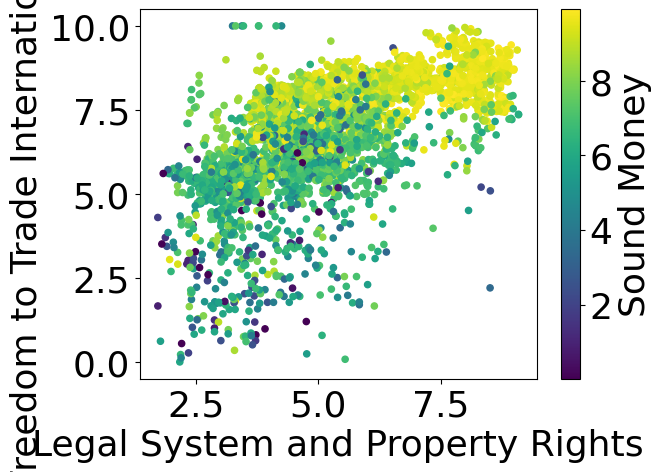

In [65]:
data.plot.scatter(c = "Sound Money",
                 x = "Legal System and Property Rights",
                 y = "Freedom to Trade Internationally")

In [76]:
from matplotlib.backends.backend_pdf import PdfPages
keys = ["Legal System and Property Rights",
        "Freedom to Trade Internationally",
        "Sound Money",
        "Size of Government"]

def color_dim_scatter(data, alpha = .7, s = 50, pp = False):
    for x in data:
        for y in data:
            for c in data:
            #don't include any visualization that has the same variable twice
                if x != y and y != c and x != c:
                    fig, ax = plt.subplots(figsize = (15,12))
                    data.plot.scatter(x = x, 
                                  y = y, 
                                  c = c, 
                                  alpha = alpha, 
                                  s = s, 
                                  ax = ax)
                    # rotate x tcik labels
                    plt.xticks(rotation=90)
                    #remove the tick lines from x and y axes
                    plt.setp(ax.get_xticklines(), visible = False)
                    plt.setp(ax.get_yticklines(), visible = False)
                    if pp != False:
                        pp.savefig(fig, bbox_inches = "tight")
                        
#3pp = PdfPages("EFWScatter.pdf")
#color_dim_scatter(data[keys], pp = pp)
#pp.close()

In [67]:
mean_data = data.groupby("Year").mean()
mean_data.head()

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Year,,,,,,
1970,5.699777,6.115453,4.828106,7.219435,5.142756,5.643092
1975,5.330897,5.638449,4.704443,6.007796,4.904180,5.600009
1980,5.358043,5.474844,4.790720,6.094311,4.946113,5.661589
1985,5.423119,5.477523,4.872785,6.261684,4.982920,5.687262
1990,5.716292,6.061804,4.964320,6.302771,5.617330,5.816249


In [68]:
median_data = data.groupby("Year").median()
median_data.head()

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Year,,,,,,
1970,5.638735,6.086700,4.316251,6.889115,5.507677,5.557182
1975,5.183213,5.590466,4.379182,6.029495,5.127087,5.608798
1980,5.254921,5.335777,4.438212,6.112553,5.144315,5.658366
1985,5.385170,5.480560,4.565765,6.486206,5.149854,5.704170
1990,5.635647,6.081242,4.583079,6.612098,5.558799,5.739436


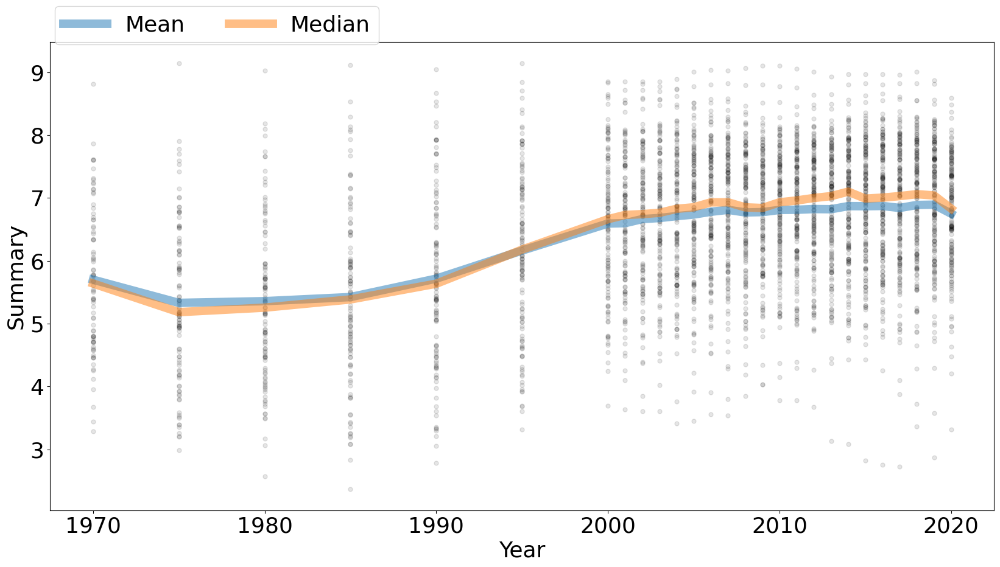

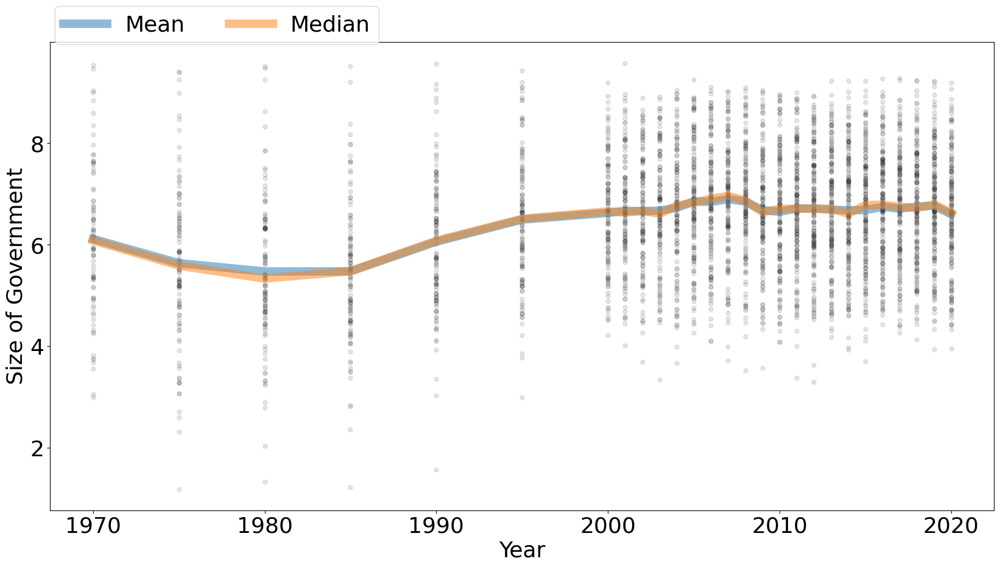

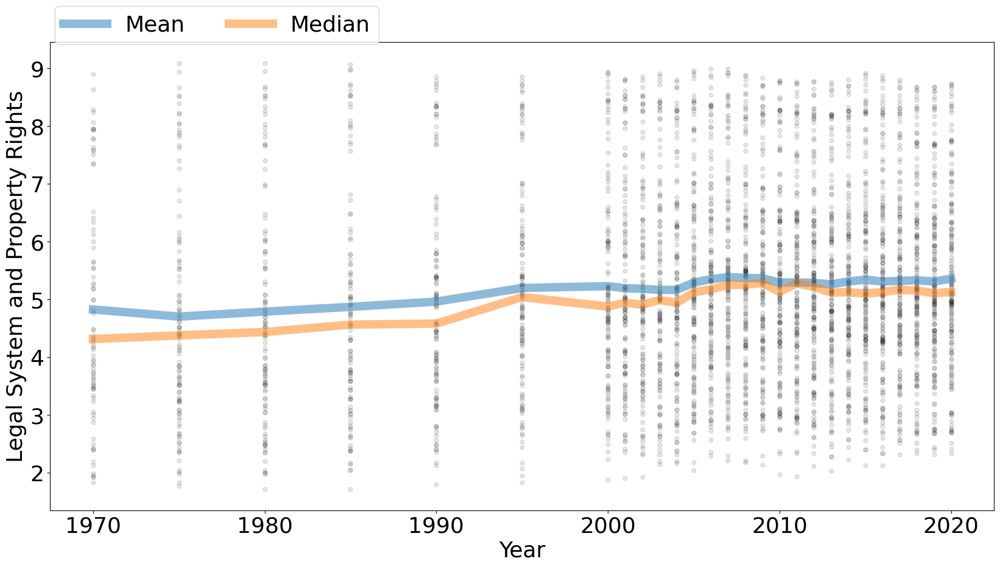

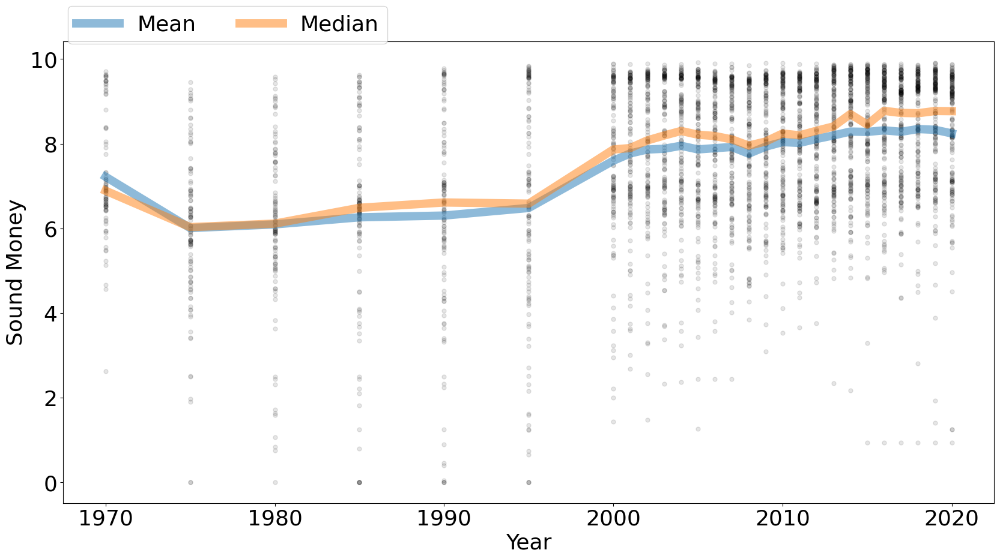

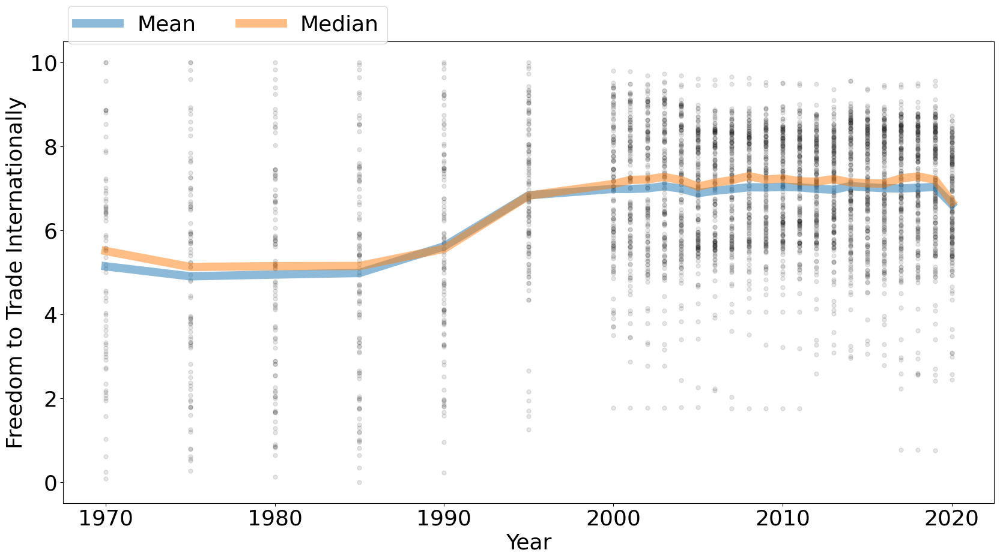

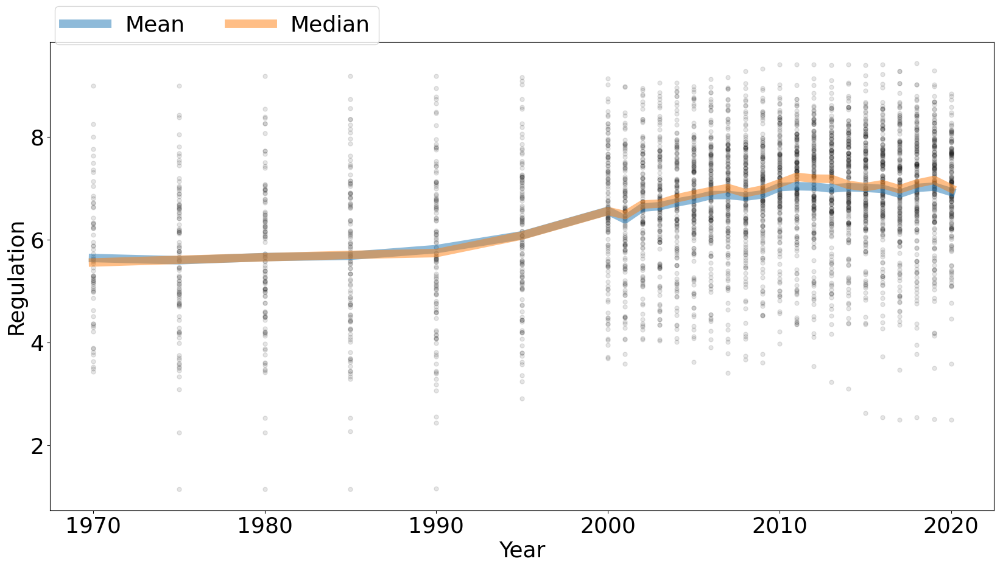

In [69]:
for key, val in data.items():
    fig, ax = plt.subplots(figsize = (20,10))
    #create the values that will indicate location on horizontal axis
    ## this will remove the entity index values attached to each year
    time = val.index.get_level_values("Year")
    # plot scatter with time as the x axis and val as the y axis
    ## since time was derived from the val index, each year will match
    ## the relevant observation
    ax.scatter(time, val, alpha =.1, color = "k", s = 25)
    mean_data[key].plot(linewidth = 10, color = "C0", alpha = .5, label = "Mean")
    median_data[key].plot(linewidth = 10, color = "C1", alpha = .5, label = "Median")
    ax.legend(bbox_to_anchor = (.36,1.1), ncols = 2)
    ax.set_ylabel(key)

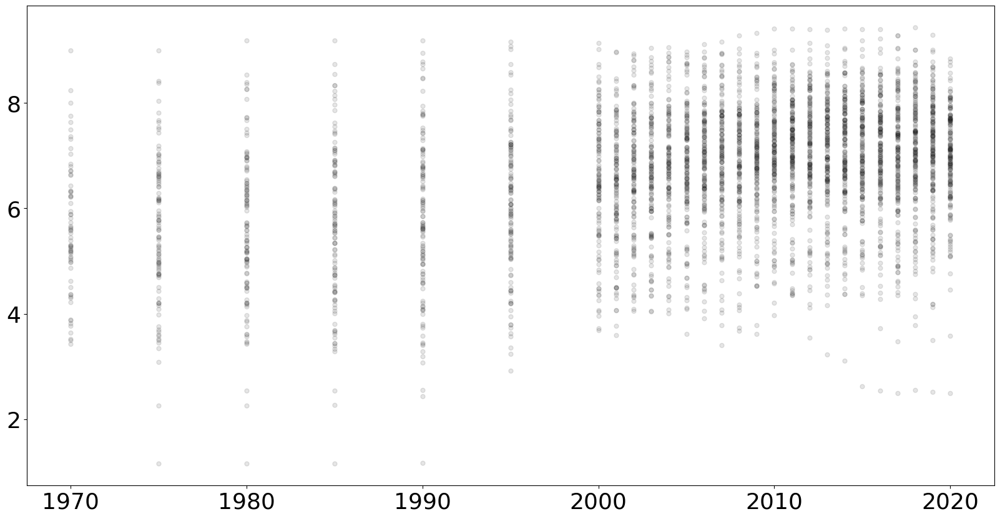

In [70]:
# extract year from index
time = val.index.get_level_values("Year")
fig,ax = plt.subplots(figsize = (20,10))
ax.scatter(time, val, alpha = .1, color = "k", s = 25)

In [71]:
val

ISO_Code_3  Year
ALB         2020    7.112958
DZA         2020    5.778953
AGO         2020    6.227545
ARG         2020    5.490538
ARM         2020    7.756333
                      ...   
GBR         1970    7.489366
USA         1970    6.631262
URY         1970         NaN
VEN         1970    5.209592
ZMB         1970    5.307952
Name: Regulation, Length: 3740, dtype: float64

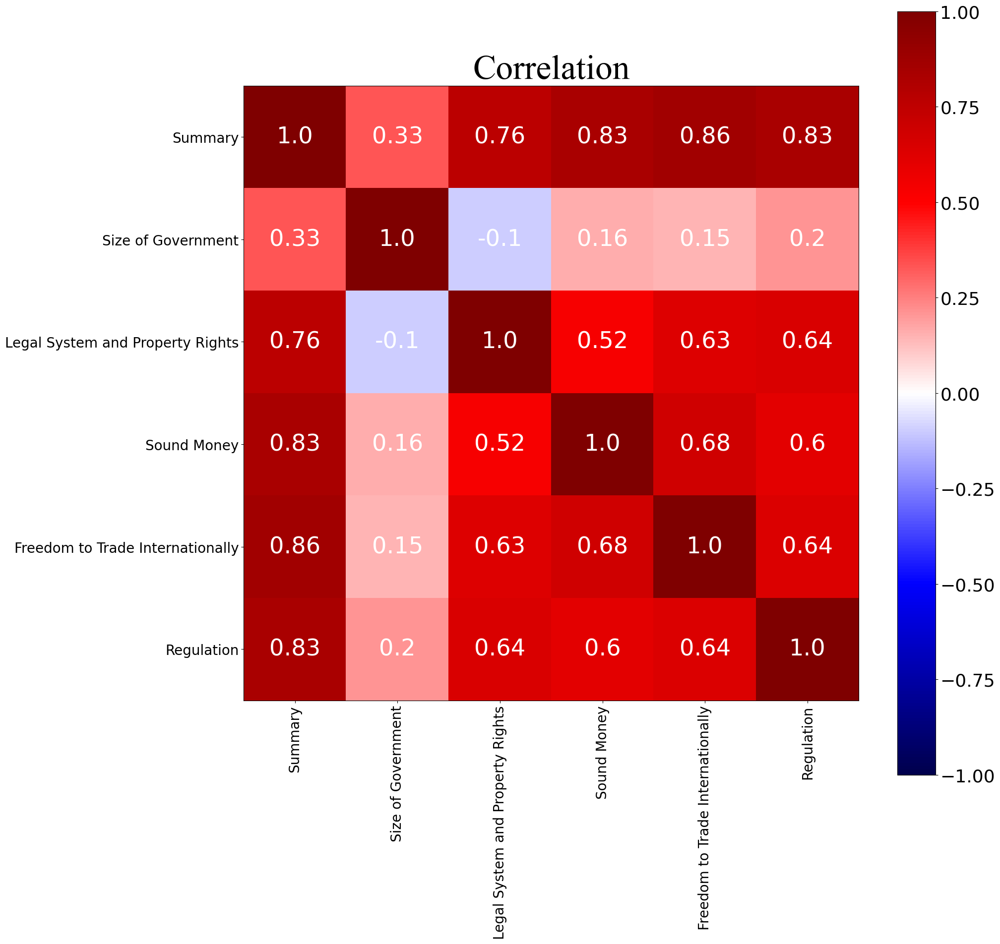

In [72]:
def corr_matrix_heatmap(data, pp = False):
    fig, ax = plt.subplots(figsize = (20,20))
    im = ax.imshow(data, norm = plt.cm.colors.Normalize(-1,1),
                  cmap = "seismic")
    ## Create labels to replace numbers
    ## Labels are the column names
    labels = data.keys()
    num_vars = len(labels)
    
    tick_labels = [lab.replace(" ", "\n") for lab in labels]
    tick_font_size = 120 / num_vars
    val_font_size = 200 / num_vars
    ## count the number of labels
    
    x_ticks = np.arange(num_vars)
    plt.xticks(x_ticks, labels,
              fontsize = tick_font_size,
              rotation = 90)
    y_ticks = np.arange(num_vars)
    plt.yticks(y_ticks, labels, 
               fontsize = tick_font_size)
    
    for i in range(len(labels)):
        for j in range(len(labels)):
            text = ax.text(i, j, str(round(data.values[i][j],2)),
                          fontsize = val_font_size,
                          ha = "center", va = "center",
                          color = "white")
    ax.set_title("Correlation", fontsize = 50,
                fontname = "Times New Roman")
    
    
    
    cbar = fig.colorbar(im)
    plt.show()
    
corr_data = data.corr()
corr_matrix_heatmap(corr_data)

C:\Users\aleah\AppData\Local\Temp\ipykernel_6124\3720358217.py:7: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared.



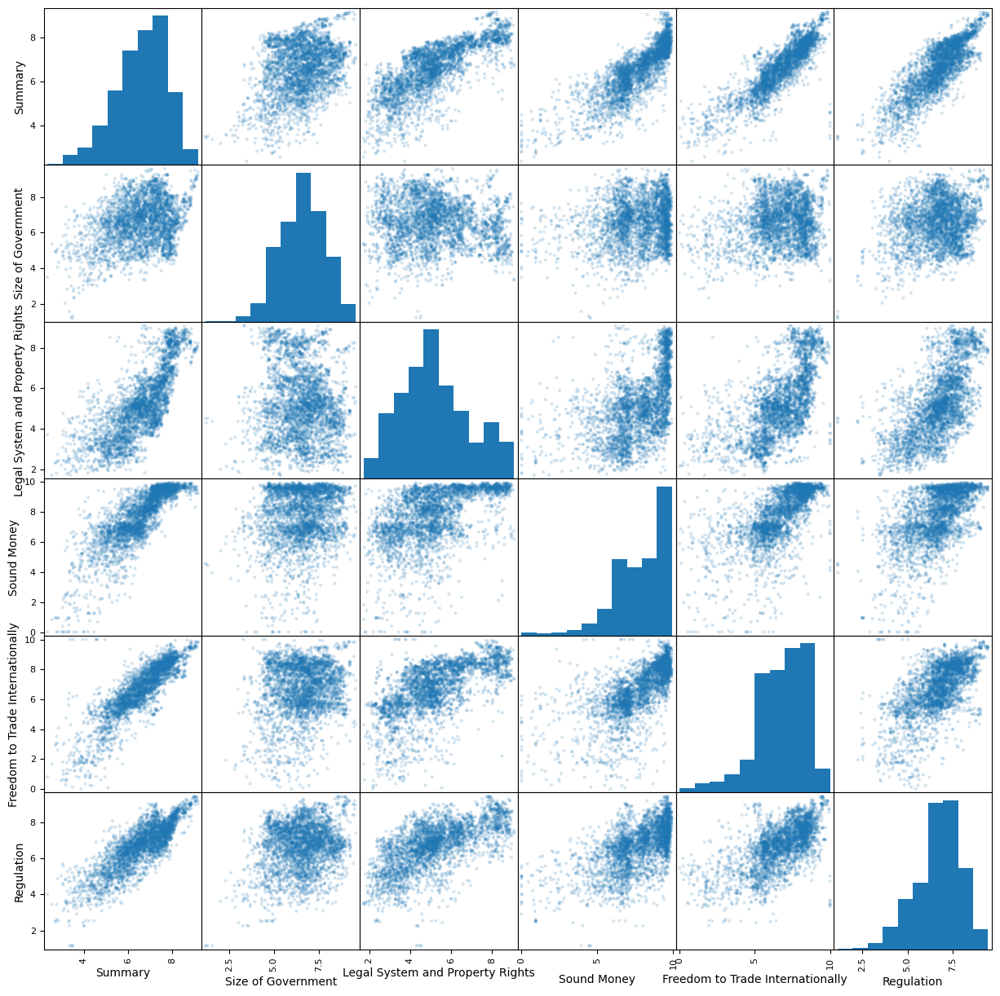

In [74]:
def formatted_scatter_matrix(data,fig_len = 15,
                             c = "C0",
                            alpha = .1, pp = False):
        plt.rcParams.update({'font.size': 10})  

        fig, ax = plt.subplots(figsize = ((fig_len, fig_len)))  
        pd.plotting.scatter_matrix(data, c = c, 
                           alpha = .2, 
                           s = 200 / len(data.keys()), ax=ax)  
        plt.show()
formatted_scatter_matrix(data)

C:\Users\aleah\AppData\Local\Temp\ipykernel_6124\1920208651.py:12: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared.



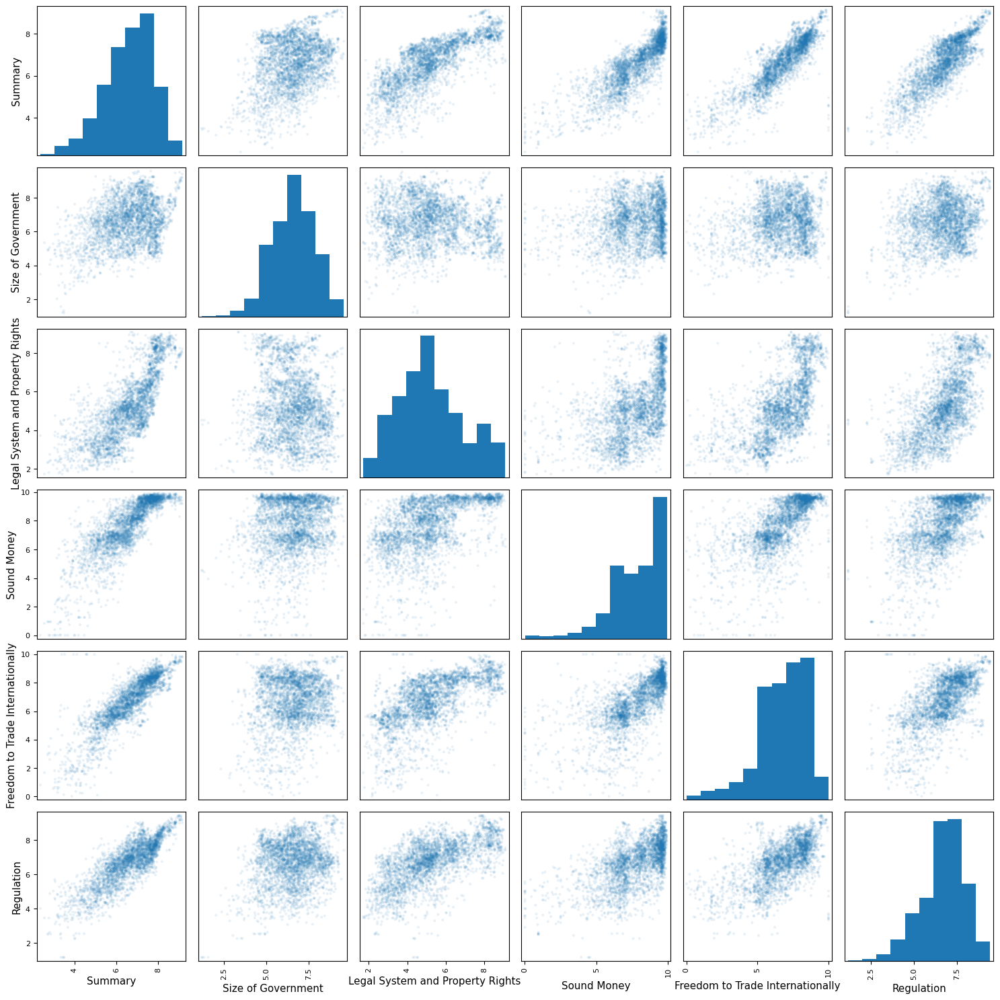

In [75]:
#econFreedomVisualization.py
# . . .
def formatted_scatter_matrix(data, c = "C0", cmap = "viridis", 
                             alpha = .1, pp=False):  
    # Create a figure showing scatterplots given in scatter_cats  
    fig_len = 15  
    fig, ax = plt.subplots(figsize = ((fig_len, fig_len)))  
    # Use fig_len to dictate fig_size, adjust size of font, size of dots, etc...  
    num_vars = len(data.keys())  
    fontsize = 65 / num_vars  
    plt.rcParams.update({'font.size': fontsize})  
    pd.plotting.scatter_matrix(data, c = c, alpha = alpha, s = 200 / num_vars, ax=ax)  
    # tight layout improves layout of text and plots in the figure  
    plt.tight_layout()  
    plt.show()  
    if pp != False:
        pp.savefig(fig, bbox_inches = "tight")  
    plt.close()  
formatted_scatter_matrix(data)